In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import os
from PIL import Image

# Define directories
input_folder = "/kaggle/input/srgan-dataset/Clean_Data_Resized-1024x1024"
output_folder_28 = "kaggle_folder_32"
output_folder_128 = "kaggle_folder_128"

# Ensure output folders exist
os.makedirs(output_folder_28, exist_ok=True)
os.makedirs(output_folder_128, exist_ok=True)

# Resize function
def resize_images(input_dir, output_dir_28, output_dir_128):
    for filename in os.listdir(input_dir):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            img_path = os.path.join(input_dir, filename)
            
            try:
                # Open and resize the image
                img = Image.open(img_path)
                
                # Resize to 32X32
                img_28 = img.resize((32, 32))
                img_28.save(os.path.join(output_dir_28, filename))
                
                # Resize to 128x128
                img_128 = img.resize((128, 128))
                img_128.save(os.path.join(output_dir_128, filename))
                
                print(f"Processed: {filename}")
            except Exception as e:
                print(f"Failed to process {filename}: {e}")

# Run the function
resize_images(input_folder, output_folder_28, output_folder_128)


In [3]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError, BinaryCrossentropy


In [4]:
def load_images(lr_folder, hr_folder):
    lr_images = []
    hr_images = []

    for img_name in os.listdir(lr_folder):
        lr_path = os.path.join(lr_folder, img_name)
        hr_path = os.path.join(hr_folder, img_name)

        # Load LR and HR images
        if os.path.exists(hr_path):
            lr_img = load_img(lr_path, target_size=(32, 32))  # Ensure correct size
            hr_img = load_img(hr_path, target_size=(128, 128))

            # Convert to arrays and normalize
            lr_images.append(img_to_array(lr_img) / 255.0)
            hr_images.append(img_to_array(hr_img) / 255.0)

    return np.array(lr_images), np.array(hr_images)

# Folders
lr_folder = "/kaggle/working/kaggle_folder_32"
hr_folder = "/kaggle/working/kaggle_folder_128"

# Load images
lr_images, hr_images = load_images(lr_folder, hr_folder)

# Check data shapes
print("LR Images Shape:", lr_images.shape)
print("HR Images Shape:", hr_images.shape)


LR Images Shape: (2050, 32, 32, 3)
HR Images Shape: (2050, 128, 128, 3)


In [5]:
batch_size = 16

def preprocess_data(lr_images, hr_images, batch_size=16):
    dataset = tf.data.Dataset.from_tensor_slices((lr_images, hr_images))
    dataset = dataset.shuffle(buffer_size=1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

train_dataset = preprocess_data(lr_images, hr_images, batch_size)


In [6]:
def build_generator(input_shape=(32, 32, 3)):
    def residual_block(x):
        residual = layers.Conv2D(64, kernel_size=3, strides=1, padding="same")(x)
        residual = layers.BatchNormalization()(residual)
        residual = layers.PReLU(shared_axes=[1, 2])(residual)
        residual = layers.Conv2D(64, kernel_size=3, strides=1, padding="same")(residual)
        residual = layers.BatchNormalization()(residual)
        return layers.Add()([x, residual])

    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, kernel_size=9, strides=1, padding="same")(inputs)
    x = layers.PReLU(shared_axes=[1, 2])(x)

    # Residual blocks
    for _ in range(16):
        x = residual_block(x)

    # Upsampling layers
    x = layers.Conv2D(256, kernel_size=3, strides=1, padding="same")(x)
    x = layers.UpSampling2D(size=2)(x)
    x = layers.PReLU(shared_axes=[1, 2])(x)

    x = layers.Conv2D(256, kernel_size=3, strides=1, padding="same")(x)
    x = layers.UpSampling2D(size=2)(x)
    x = layers.PReLU(shared_axes=[1, 2])(x)

    outputs = layers.Conv2D(3, kernel_size=9, strides=1, padding="same", activation="tanh")(x)

    return Model(inputs, outputs, name="Generator")

generator = build_generator()
generator.summary()


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 32, 32, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 32, 32, 64)     │         15,616 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ p_re_lu (PReLU)           │ (None, 32, 32, 64)     │             64 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ p_re_lu[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 32, 32, 64)     │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ p_re_lu_1 (PReLU)         │ (None, 32, 32, 64)     │             64 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ p_re_lu_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 32, 32, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 32, 32, 64)     │              0 │ p_re_lu[0][0],         │
│                           │                        │                │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 32, 32, 64)     │            256 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ p_re_lu_2 (PReLU)         │ (None, 32, 32, 64)     │             64 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ p_re_lu_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 32, 32, 64)     │            256 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 32, 32, 64)     │              0 │ add[0][0],             │
│                           │                        │                │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 2,007,107 (7.66 MB)

 Trainable params: 2,003,011 (7.64 MB)

 Non-trainable params: 4,096 (16.00 KB)

In [7]:
def build_discriminator(input_shape=(128, 128, 3)):
    def conv_block(x, filters, kernel_size, strides):
        x = layers.Conv2D(filters, kernel_size=kernel_size, strides=strides, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        return x

    inputs = layers.Input(shape=input_shape)
    x = conv_block(inputs, 64, kernel_size=3, strides=1)

    # Convolutional blocks
    for filters in [64, 128, 128, 256, 256, 512, 512]:
        strides = 2 if filters % 128 == 0 else 1
        x = conv_block(x, filters, kernel_size=3, strides=strides)

    x = layers.Flatten()(x)
    x = layers.Dense(1024)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    outputs = layers.Dense(1, activation="sigmoid")(x)

    return Model(inputs, outputs, name="Discriminator")

discriminator = build_discriminator()
discriminator.summary()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_36 (Conv2D)                   │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_32               │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_33               │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_34               │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_35               │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_36               │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 8, 8, 256)           │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_37               │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 6,792,257 (25.91 MB)

 Trainable params: 6,788,417 (25.90 MB)

 Non-trainable params: 3,840 (15.00 KB)

In [8]:
def build_vgg_loss():
    vgg = tf.keras.applications.VGG19(include_top=False, input_shape=(128, 128, 3))
    vgg.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer("block5_conv4").output)
    return model

vgg = build_vgg_loss()


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
generator_optimizer = Adam(learning_rate=1e-4)
discriminator_optimizer = Adam(learning_rate=1e-4)
mse = MeanSquaredError()
binary_crossentropy = BinaryCrossentropy()


In [10]:
@tf.function
def train_step(lr_images, hr_images):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate HR images
        generated_images = generator(lr_images, training=True)

        # Discriminator loss
        real_output = discriminator(hr_images, training=True)
        fake_output = discriminator(generated_images, training=True)
        disc_loss = binary_crossentropy(tf.ones_like(real_output), real_output) + \
                    binary_crossentropy(tf.zeros_like(fake_output), fake_output)

        # Generator loss
        perceptual_loss = mse(vgg(hr_images), vgg(generated_images))
        adversarial_loss = binary_crossentropy(tf.ones_like(fake_output), fake_output)
        gen_loss = perceptual_loss + 1e-3 * adversarial_loss

    # Compute gradients
    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply gradients
    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_loss, disc_loss


In [17]:
epochs = 10
save_path = "/kaggle/working/srgan_model"

for epoch in range(epochs):
    gen_loss_total, disc_loss_total = 0, 0

    for step, (lr_batch, hr_batch) in enumerate(train_dataset):
        gen_loss, disc_loss = train_step(lr_batch, hr_batch)
        gen_loss_total += gen_loss
        disc_loss_total += disc_loss

    print(f"Epoch {epoch + 1}/{epochs} | Generator Loss: {gen_loss_total:.4f} | Discriminator Loss: {disc_loss_total:.4f}")

    # Save the generator model every 10 epochs
    if (epoch + 1) % 10 == 0:
        generator.save(f"{save_path}_epoch_{epoch + 1}.h5")


Epoch 1/10 | Generator Loss: 4.1825 | Discriminator Loss: 60.8330
Epoch 2/10 | Generator Loss: 4.0123 | Discriminator Loss: 75.5506
Epoch 3/10 | Generator Loss: 3.9761 | Discriminator Loss: 63.1996
Epoch 4/10 | Generator Loss: 4.0386 | Discriminator Loss: 79.1271
Epoch 5/10 | Generator Loss: 3.8480 | Discriminator Loss: 57.9501
Epoch 6/10 | Generator Loss: 3.8764 | Discriminator Loss: 49.3254
Epoch 7/10 | Generator Loss: 3.7384 | Discriminator Loss: 73.9402
Epoch 8/10 | Generator Loss: 3.7982 | Discriminator Loss: 74.2862
Epoch 9/10 | Generator Loss: 3.7155 | Discriminator Loss: 38.8464
Epoch 10/10 | Generator Loss: 3.6388 | Discriminator Loss: 52.9436


In [51]:
def upscale_image(image_path, model):
    img = load_img(image_path, target_size=(32, 32))
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)
    high_res = model.predict(img_array)
    return (high_res[0] * 255).astype(np.uint8)

test_image_path = "/kaggle/working/kaggle_folder_32/original_IMG1015_resized.jpg"
upscaled_image = upscale_image(test_image_path, generator)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


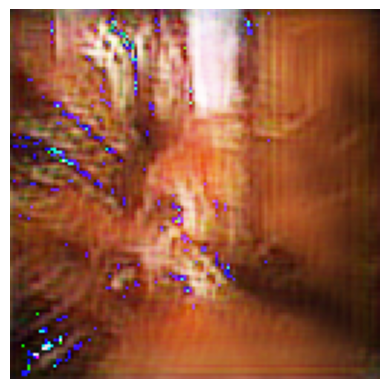

In [54]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image
# img = mpimg.imread('path_to_image.jpg')

# Display the image
plt.imshow(upscaled_image)
plt.axis('off')  # Optional: to remove axes
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


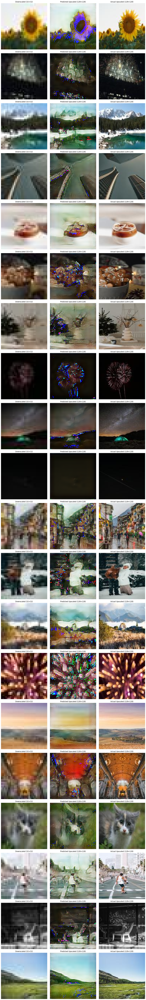

In [18]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Define function to upscale image
def upscale_image(image_path, model):
    # Load and preprocess the 32×32 image
    img = load_img(image_path, target_size=(32, 32))
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)  # Normalize and batchify
    high_res = model.predict(img_array)  # Predict upscaled image
    return (high_res[0] * 255).astype(np.uint8)  # Rescale to [0, 255]

# Set paths
input_dir_32 = "/kaggle/working/kaggle_folder_32/"  # Directory for original images (32×32 source)
input_dir_128 = "/kaggle/working/kaggle_folder_128/"  # Directory for ground truth 128×128 images

# Collect image names (shared filenames in both directories)
all_images = [f for f in os.listdir(input_dir_32) if f.endswith(".jpg")]

# Randomly select 10 images
selected_images = random.sample(all_images, 20)

# Plot downscaled, predicted, and actual images
fig, axes = plt.subplots(len(selected_images), 3, figsize=(15, 5 * len(selected_images)))

for i, image_name in enumerate(selected_images):
    # Paths for the downscaled and ground truth images
    img_path_32 = os.path.join(input_dir_32, image_name)
    img_path_128 = os.path.join(input_dir_128, image_name)

    # Downscaled image (32×32)
    downscaled_img = load_img(img_path_32, target_size=(32, 32))
    downscaled_array = img_to_array(downscaled_img).astype(np.uint8)

    # Predicted upscaled image (128×128)
    predicted_img = upscale_image(img_path_32, generator)

    # Actual upscaled image (128×128 ground truth)
    actual_img = img_to_array(load_img(img_path_128, target_size=(128, 128))).astype(np.uint8)

    # Plot downscaled image
    axes[i, 0].imshow(downscaled_array.astype(np.uint8))
    axes[i, 0].set_title("Downscaled (32×32)")
    axes[i, 0].axis("off")

    # Plot predicted upscaled image
    axes[i, 1].imshow(predicted_img.astype(np.uint8))
    axes[i, 1].set_title("Predicted Upscaled (128×128)")
    axes[i, 1].axis("off")

    # Plot actual upscaled image (ground truth)
    axes[i, 2].imshow(actual_img.astype(np.uint8))
    axes[i, 2].set_title("Actual Upscaled (128×128)")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()


In [50]:
# Save the model
generator.save('generator_model.h5')
discriminator.save('discriminator_model.h5')


In [20]:
# Load the saved models
generator = tf.keras.models.load_model('generator_model.h5')
discriminator = tf.keras.models.load_model('discriminator_model.h5')


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


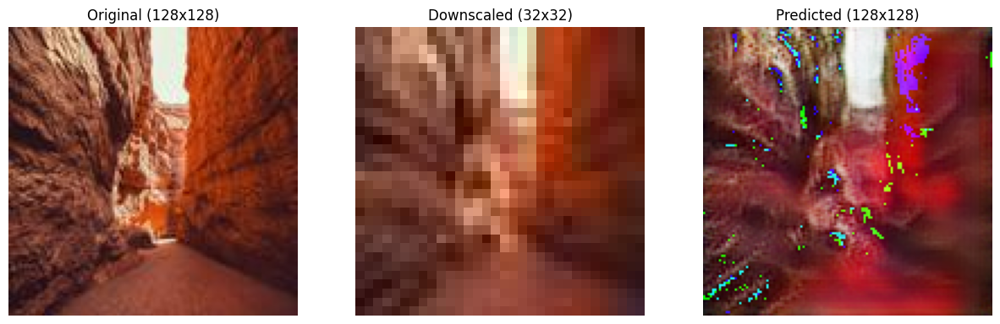

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


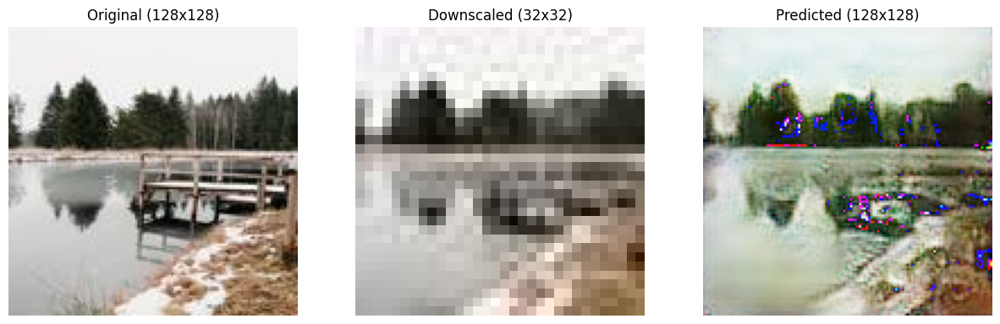

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


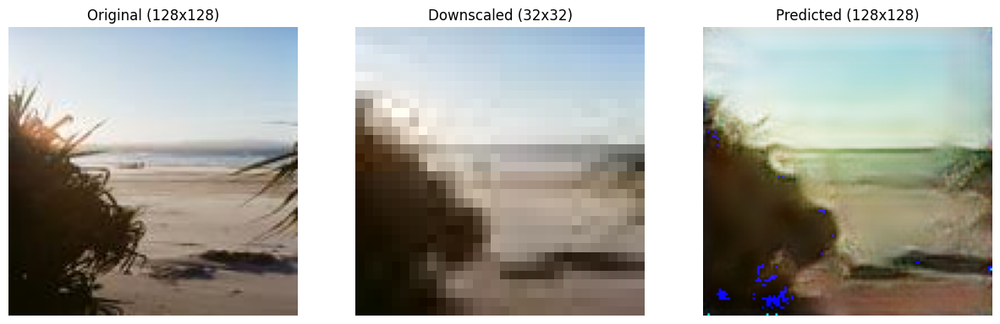

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


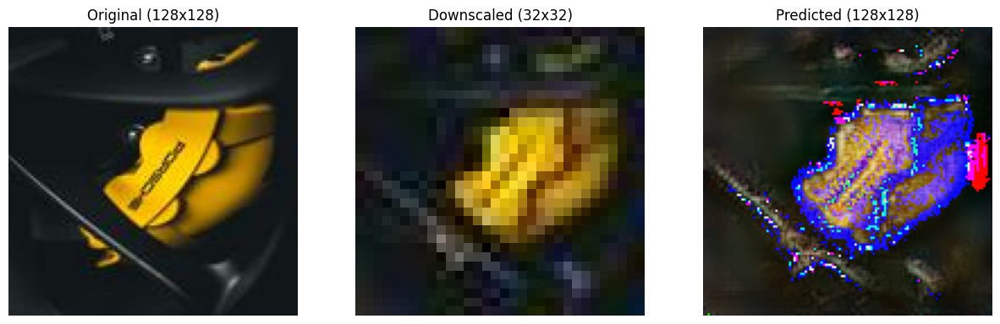

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


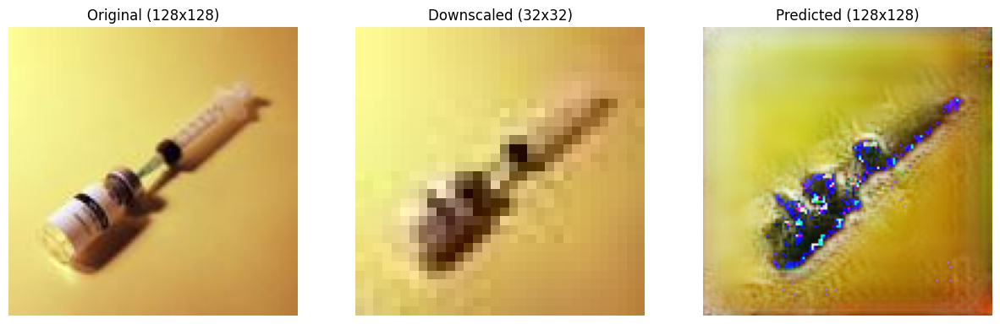

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


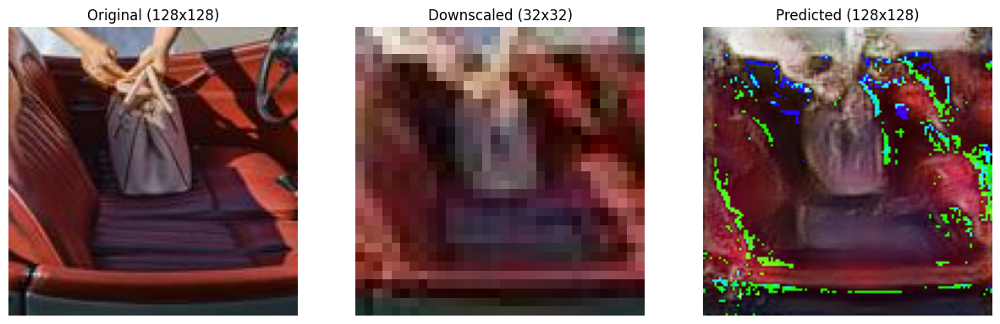

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


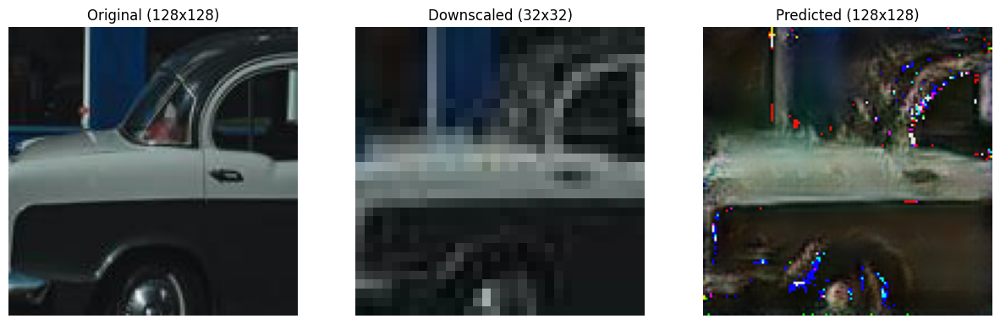

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


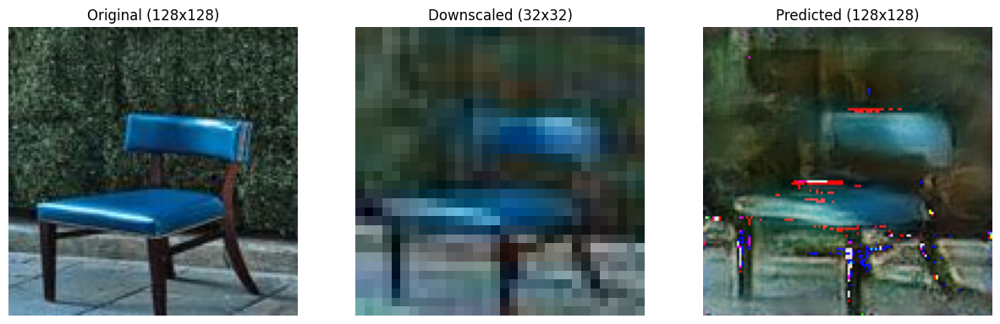

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


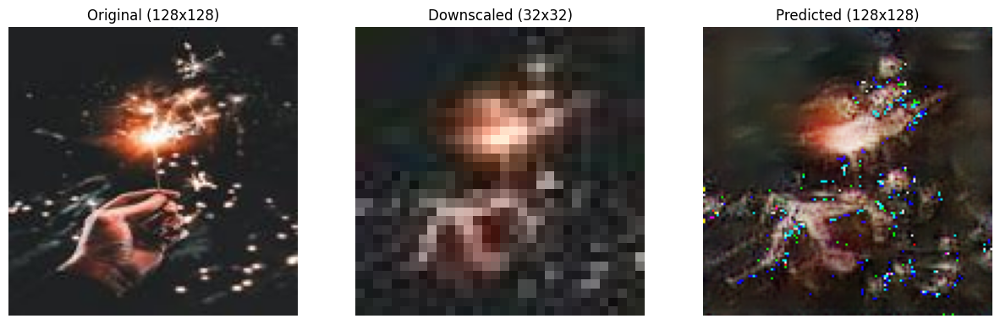

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


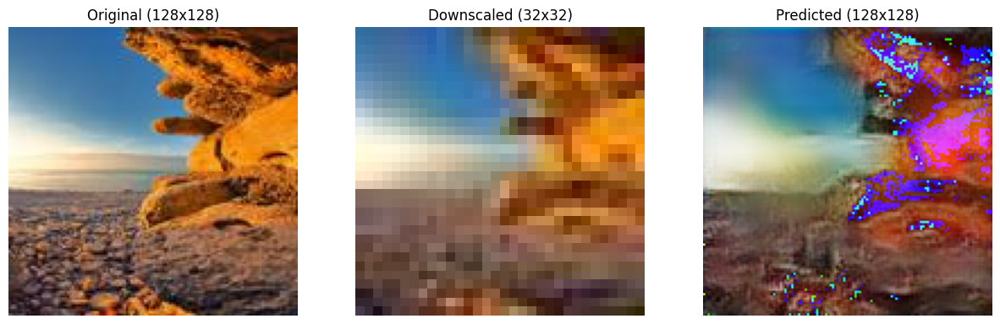

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Function to upscale image using the trained model
def upscale_image(image_path, model):
    img = load_img(image_path, target_size=(32, 32))
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)
    high_res = model.predict(img_array)
    return (high_res[0] * 255).astype(np.uint8)

# Function to visualize the original, downscaled, and predicted images in a single row
def visualize_comparison(actual, downscaled, predicted, titles):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for ax, img, title in zip(axes, [actual, downscaled, predicted], titles):
        ax.imshow(img.astype(np.uint8))
        ax.set_title(title)
        ax.axis('off')
    plt.show()

# Save the trained model
generator.save('30_gen_model.h5')

# Load the saved model
model_10 = load_model('30_gen_model.h5')

# List of test image paths from your folder
image_paths = [
    "/kaggle/working/kaggle_folder_32/original_IMG1015_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1016_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1017_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1018_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1019_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1020_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1021_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1022_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1023_resized.jpg",
    "/kaggle/working/kaggle_folder_32/original_IMG1024_resized.jpg"
]

# Predict and visualize for 10 images
for image_path in image_paths:
    # Load the original high-resolution image (assume it's from the 128x128 folder)
    original_img = load_img(image_path.replace("kaggle_folder_32", "kaggle_folder_128"), target_size=(128, 128))
    original_img = img_to_array(original_img)

    # Downscale the image to 32x32 for simulation
    downscaled_img = load_img(image_path, target_size=(32, 32))
    downscaled_img = img_to_array(downscaled_img)

    # Predict the high-resolution image using the loaded model
    predicted_img = upscale_image(image_path, model_10)

    # Visualize the images side-by-side
    visualize_comparison(
        actual=original_img,
        downscaled=downscaled_img,
        predicted=predicted_img,
        titles=["Original (128x128)", "Downscaled (32x32)", "Predicted (128x128)"]
    )


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


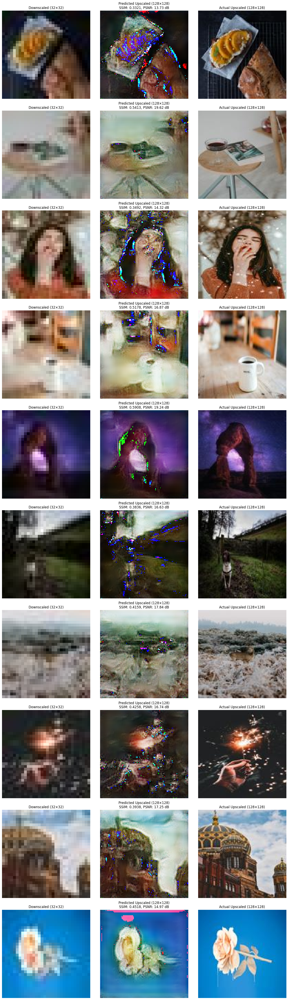

Average SSIM: 0.4402
Average PSNR: 16.72 dB


In [19]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

# Define function to upscale image
def upscale_image(image_path, model):
    # Load and preprocess the 32×32 image
    img = load_img(image_path, target_size=(32, 32))
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)  # Normalize and batchify
    high_res = model.predict(img_array)  # Predict upscaled image
    return (high_res[0] * 255).astype(np.uint8)  # Rescale to [0, 255]

# Set paths
input_dir_32 = "/kaggle/working/kaggle_folder_32/"  # Directory for original images (32×32 source)
input_dir_128 = "/kaggle/working/kaggle_folder_128/"  # Directory for ground truth 128×128 images

# Collect image names (shared filenames in both directories)
all_images = [f for f in os.listdir(input_dir_32) if f.endswith(".jpg")]

# Randomly select 10 images
selected_images = random.sample(all_images, 10)

# Initialize lists to store SSIM and PSNR scores
ssim_scores = []
psnr_scores = []

# Plot downscaled, predicted, and actual images
fig, axes = plt.subplots(len(selected_images), 3, figsize=(15, 5 * len(selected_images)))

for i, image_name in enumerate(selected_images):
    # Paths for the downscaled and ground truth images
    img_path_32 = os.path.join(input_dir_32, image_name)
    img_path_128 = os.path.join(input_dir_128, image_name)

    # Downscaled image (32×32)
    downscaled_img = load_img(img_path_32, target_size=(32, 32))
    downscaled_array = img_to_array(downscaled_img).astype(np.uint8)

    # Predicted upscaled image (128×128)
    predicted_img = upscale_image(img_path_32, generator)

    # Actual upscaled image (128×128 ground truth)
    actual_img = img_to_array(load_img(img_path_128, target_size=(128, 128))).astype(np.uint8)

    # Compute SSIM and PSNR
    try:
        ssim_value = ssim(
            actual_img, 
            predicted_img, 
            channel_axis=-1,  # Specify the color channel axis
            data_range=predicted_img.max() - predicted_img.min()
        )
        psnr_value = psnr(
            actual_img, 
            predicted_img, 
            data_range=predicted_img.max() - predicted_img.min()
        )
    except ValueError as e:
        print(f"Error computing SSIM or PSNR for image {image_name}: {e}")
        ssim_value = psnr_value = None

    # Append scores to lists
    if ssim_value is not None and psnr_value is not None:
        ssim_scores.append(ssim_value)
        psnr_scores.append(psnr_value)

    # Plot downscaled image
    axes[i, 0].imshow(downscaled_array.astype(np.uint8))
    axes[i, 0].set_title("Downscaled (32×32)")
    axes[i, 0].axis("off")

    # Plot predicted upscaled image
    axes[i, 1].imshow(predicted_img.astype(np.uint8))
    axes[i, 1].set_title(f"Predicted Upscaled (128×128)\nSSIM: {ssim_value:.4f}, PSNR: {psnr_value:.2f} dB" if ssim_value is not None and psnr_value is not None else "Error in Metrics")
    axes[i, 1].axis("off")

    # Plot actual upscaled image (ground truth)
    axes[i, 2].imshow(actual_img.astype(np.uint8))
    axes[i, 2].set_title("Actual Upscaled (128×128)")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

# Print average SSIM and PSNR scores
if ssim_scores and psnr_scores:
    print(f"Average SSIM: {np.mean(ssim_scores):.4f}")
    print(f"Average PSNR: {np.mean(psnr_scores):.2f} dB")
else:
    print("No valid SSIM or PSNR scores to compute averages.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


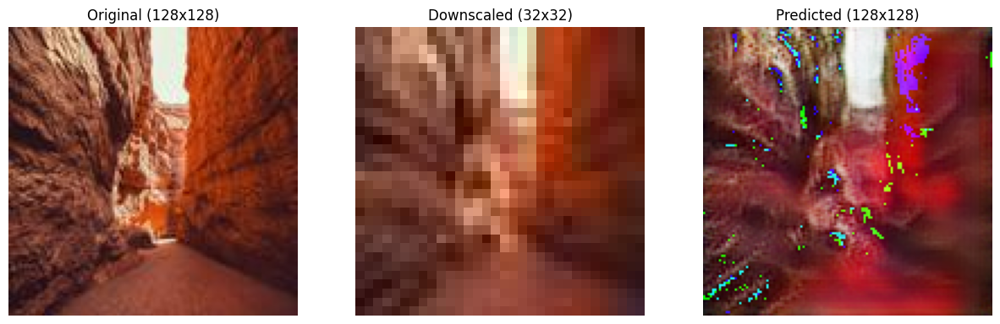

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


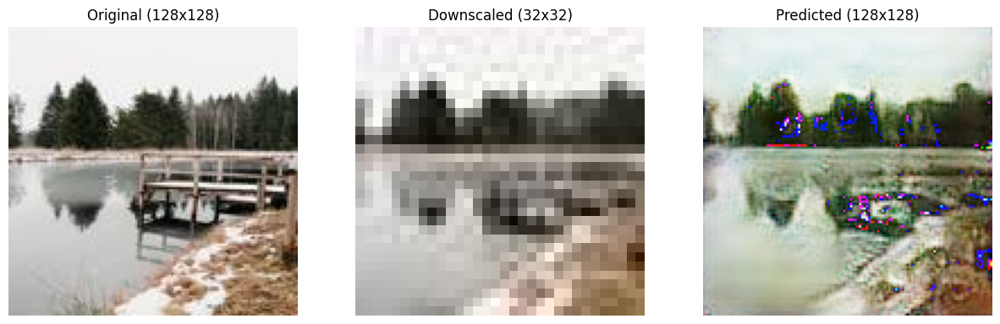

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


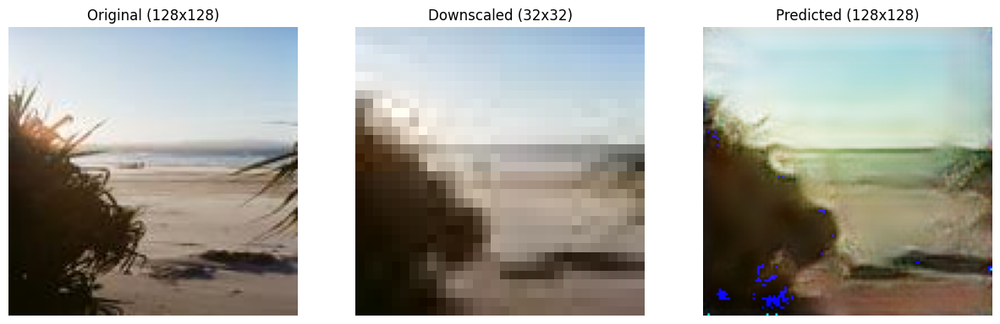

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


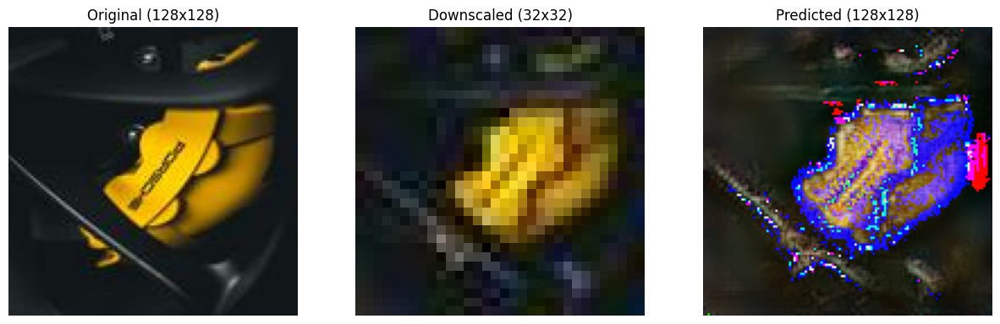

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


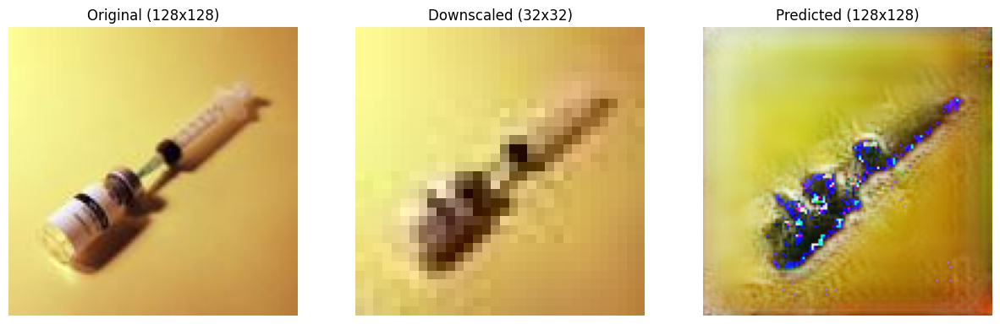

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


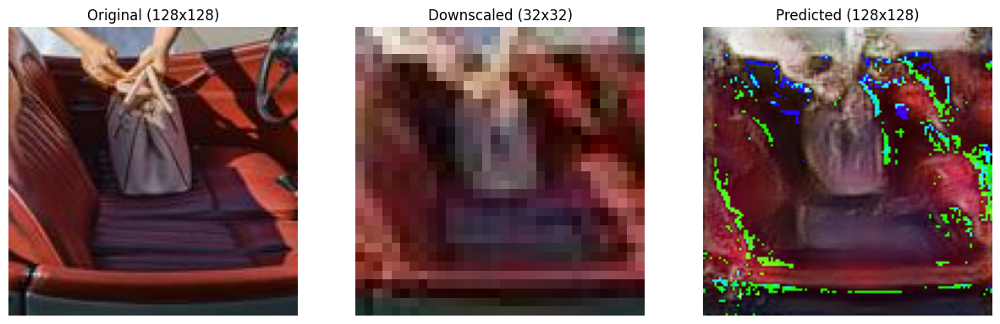

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


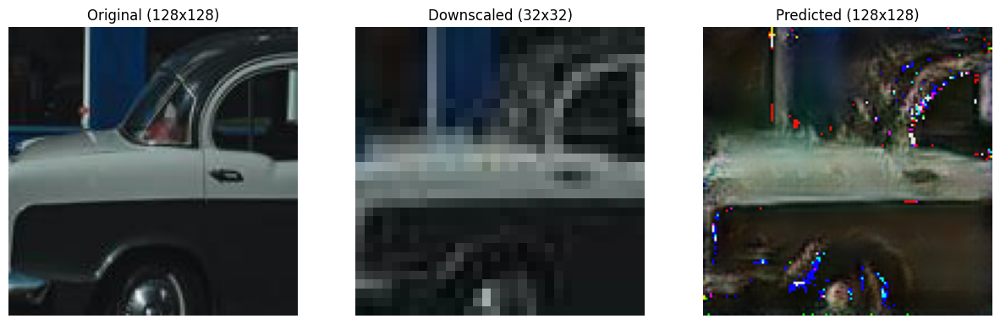

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


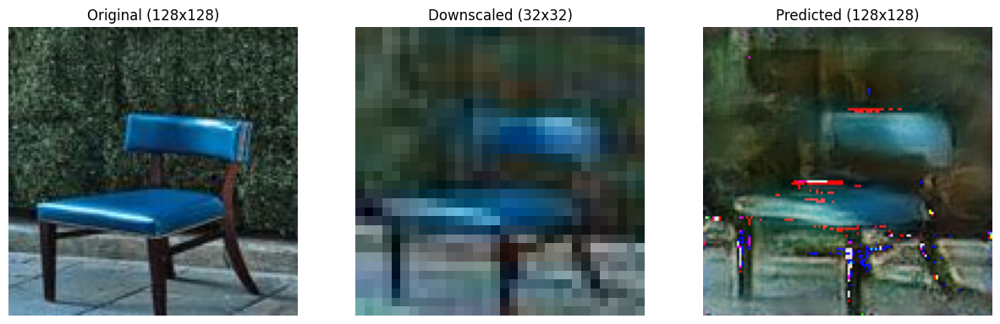

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


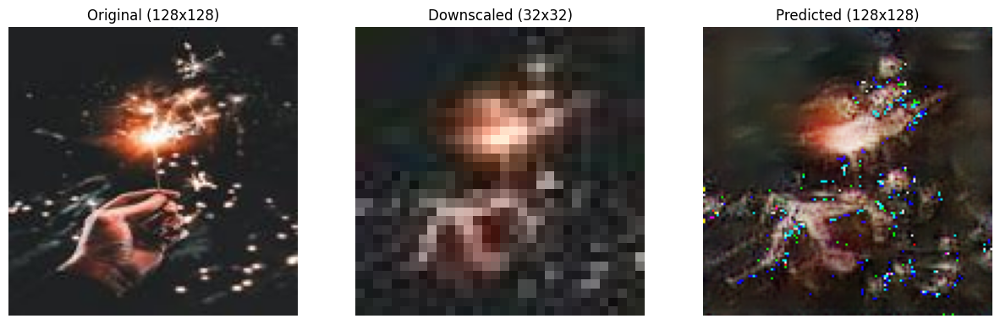

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


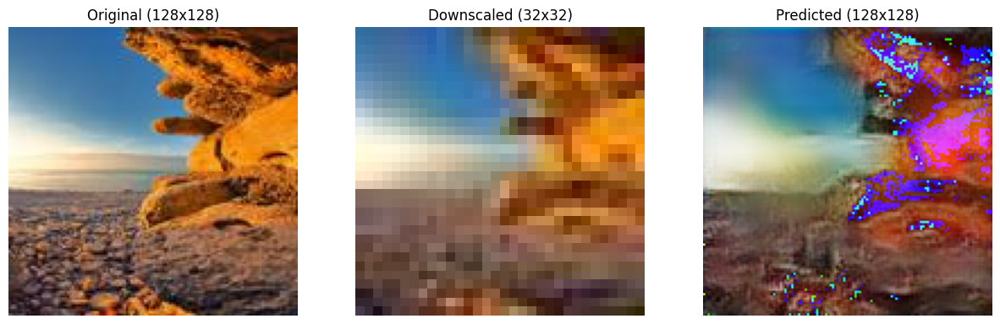

Average SSIM: 0.4336
Average PSNR: 15.83 dB


In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

# Function to upscale image using the trained model
def upscale_image(image_path, model):
    img = load_img(image_path, target_size=(32, 32))
    img_array = np.expand_dims(img_to_array(img) / 255.0, axis=0)  # Normalize and batchify
    high_res = model.predict(img_array)  # Predict upscaled image
    return (high_res[0] * 255).astype(np.uint8)  # Rescale to [0, 255]

# Function to visualize the original, downscaled, and predicted images in a single row
def visualize_comparison(actual, downscaled, predicted, titles):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for ax, img, title in zip(axes, [actual, downscaled, predicted], titles):
        ax.imshow(img.astype(np.uint8))
        ax.set_title(title)
        ax.axis('off')
    plt.show()

# Define pipeline to load model and use it for predictions
def prediction_pipeline(model_path, image_paths, input_dir_32, input_dir_128):
    # Load the trained model
    model = load_model(model_path)

    # Initialize lists to store SSIM and PSNR scores
    ssim_scores = []
    psnr_scores = []

    # Process each image
    for image_path in image_paths:
        try:
            # Paths for downscaled and ground truth images
            img_path_32 = os.path.join(input_dir_32, image_path)
            img_path_128 = os.path.join(input_dir_128, image_path)

            # Load the original high-resolution image (ground truth)
            original_img = load_img(img_path_128, target_size=(128, 128))
            original_img_array = img_to_array(original_img)

            # Load the downscaled image (32x32)
            downscaled_img = load_img(img_path_32, target_size=(32, 32))
            downscaled_img_array = img_to_array(downscaled_img)

            # Predict the high-resolution image using the model
            predicted_img = upscale_image(img_path_32, model)

            # Compute SSIM and PSNR
            ssim_value = ssim(
                original_img_array, 
                predicted_img, 
                channel_axis=-1,  # Specify the color channel axis
                data_range=predicted_img.max() - predicted_img.min()
            )
            psnr_value = psnr(
                original_img_array, 
                predicted_img, 
                data_range=predicted_img.max() - predicted_img.min()
            )

            # Append scores to lists
            ssim_scores.append(ssim_value)
            psnr_scores.append(psnr_value)

            # Visualize the images side-by-side
            visualize_comparison(
                actual=original_img_array,
                downscaled=downscaled_img_array,
                predicted=predicted_img,
                titles=["Original (128x128)", "Downscaled (32x32)", "Predicted (128x128)"]
            )

        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

    # Print average SSIM and PSNR scores
    if ssim_scores and psnr_scores:
        print(f"Average SSIM: {np.mean(ssim_scores):.4f}")
        print(f"Average PSNR: {np.mean(psnr_scores):.2f} dB")
    else:
        print("No valid SSIM or PSNR scores to compute averages.")

# Example usage
if __name__ == "__main__":
    model_path = "30_gen_model.h5"
    input_dir_32 = "/kaggle/working/kaggle_folder_32/"
    input_dir_128 = "/kaggle/working/kaggle_folder_128/"

    image_paths = [
        "original_IMG1015_resized.jpg",
        "original_IMG1016_resized.jpg",
        "original_IMG1017_resized.jpg",
        "original_IMG1018_resized.jpg",
        "original_IMG1019_resized.jpg",
        "original_IMG1020_resized.jpg",
        "original_IMG1021_resized.jpg",
        "original_IMG1022_resized.jpg",
        "original_IMG1023_resized.jpg",
        "original_IMG1024_resized.jpg"
    ]

    prediction_pipeline(model_path, image_paths, input_dir_32, input_dir_128)
